![seQuencing logo](../images/sequencing-logo.svg)

# SNAP Gate

In this notebook we implement the SNAP (selective number-dependent arbitrary phase) gate on a system composed of a `Transmon` and a `Cavity`. When combined with displacements, SNAP can be used to construct arbitrary unitary operations on a qubit encoded in an oscillator.

In particular, we will reproduce some of the central results of this paper:

> Cavity State Manipulation Using Photon-Number Selective Phase Gates  
> Physical Review Letters, **115**, 13, 137002 (2015).  
> DOI: [10.1103/PhysRevLett.115.137002](http://dx.doi.org/10.1103/PhysRevLett.115.137002)  
> [Full text (open-access pdf)](https://rsl.yale.edu/sites/default/files/2015_heeres_cavity_state_manipulation_physrevlett.115.137002.15.pdf)  

The goal of a SNAP gate is to apply a phase $\theta_n$ to each Fock state $|n\rangle$ of a cavity mode. We can write the SNAP unitary as
$$S(\theta_1,\ldots,\theta_{n_\mathrm{max}}) = S(\vec{\theta}) = \prod_{n=1}^{n_\mathrm{max}} \exp(i\theta_n|n\rangle\langle n|).$$

See the paper linked above for a detailed explanation of the implementation of SNAP in a system of a cavity dispersively coupled to a transmon qubit. The basic idea is to apply a different geometric phase (similar to a Berry phase) to each Fock state by rotating the transmon about different axes conditioned on the state of the cavity. This is done by applying a "comb" of cavity photon-number selective (narrow bandwidth) transmon pulses.

In [1]:
%config InlineBackend.figure_formats = ['svg']
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import qutip

from sequencing import Transmon, Cavity, System, get_sequence, sync, delay

## Prepare the system

In [2]:
# Transmon with anharmonicity of 200 MHz
qubit = Transmon('qubit', levels=3, kerr=-200e-3)
qubit.gaussian_pulse.sigma = 600 # ns

# Cavity with 50 kHz self-Kerr
cavity = Cavity('cavity', levels=15, kerr=-50e-6)
cavity.gaussian_pulse.sigma = 20

system = System('system', modes=[qubit, cavity])
# Dispersive shift chi/2pi = 6 MHz between the transmon and cavity
system.set_cross_kerr(qubit, cavity, -6e-3)

## SNAP sequence

In [3]:
def snap(
        system, phases, initial_phase=0, qubit_name='qubit', cavity_name='cavity',
        pulse_name='gaussian_pulse'
    ):
    qubit = system.get_mode(qubit_name)
    cavity = system.get_mode(cavity_name)
    if len(phases) != cavity.levels:
        raise ValueError(
            f'Expected len(phases) to be {cavity.levels}, '
            f'but got {len(phases)}.'
        )
    pulse = qubit.pulses[pulse_name]
    pulse_length = pulse.sigma * pulse.chop # ns
    # Dispersive shift, in GHz
    chi = system.cross_kerrs[frozenset([qubit.name, cavity.name])]
    
    # Pulses on the same Mode which are not separated by
    # sync() statements simply sum togeter, so this for loop
    # is creating a superposition of n modulated gaussian pulses.
    for n, theta in enumerate(phases):
        # The first set of pulses rotates the qubit about the same
        # axis for each cavity Fock state.
        qubit.rotate(np.pi, -initial_phase, detune=n * chi)
    sync()
    for n, theta in enumerate(phases):
        # The second set of pulses are performed about a
        # cavity photon number-dependent axis.
        phase = sum([
            initial_phase,
            n * (n-1) * np.pi * cavity.kerr * pulse_length * 2,
            2 * np.pi * n * chi * pulse_length,
            theta,
        ])
        qubit.rotate(np.pi, -phase, detune=n * chi)

## Experiment #1
- Prepare $|g\rangle\otimes\sum_{n=0}^{n_\text{max}}|n\rangle$, where $n_\text{max}=$ `cavity.levels`
- Apply $S(\vec\theta)$ where $\vec\theta=\{\theta_n\}$ and $\theta_n=2n\pi/n_\text{max}$

Generate and simulate the sequence

In [4]:
phases = 2 * np.pi * np.linspace(0, 1, cavity.levels)

# |g,0> + |g,1> + ... + |g,cavity.levels>
init_state = sum(
    system.fock(cavity=n) for n in range(cavity.levels)
).unit()

# |g,0> + 2 * pi / cavity.levels |g, 1> + ... + 2 * pi * |g,cavity.levels>
target_state = sum(
    system.fock(cavity=n) * np.exp(1j * phi) for n, phi in enumerate(phases)
).unit()

seq = get_sequence(system)
snap(system, phases)

result = seq.run(init_state)
final_state = result.states[-1]

fidelity = qutip.fidelity(final_state, target_state)**2
print(f'State fidelity: {100*fidelity:.2f}%')
assert fidelity > 0.989

State fidelity: 99.49%


Plot the Hamiltonian coefficients

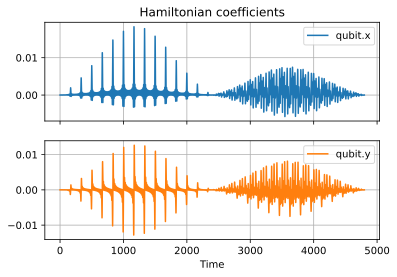

In [5]:
fig, ax = seq.plot_coefficients(subplots=True)

Inspect the resulting cavity state by plotting the Wigner function.

In [6]:
fig, (ax, bx) = plt.subplots(1,2, sharex=True, sharey=True)
qutip.plot_wigner(target_state.ptrace(cavity.index), ax=ax)
qutip.plot_wigner(final_state.ptrace(cavity.index), ax=bx)

ax.set_aspect('equal')
ax.set_title('target')
bx.set_aspect('equal')
bx.set_title('snap')
fig.suptitle('Cavity state Wigner')
fig.tight_layout()
fig.subplots_adjust(top=1)

Extract and plot the resulting phase of each Fock state.

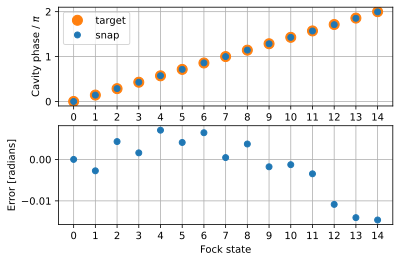

In [7]:
cavity_state = final_state.ptrace(cavity.index)
target_cavity_state = target_state.ptrace(cavity.index)

angles = []
angles_target = []

for n in range(cavity.levels):
    proj = cavity.fock_dm(n, full_space=False)
    angles.append(np.angle((proj * cavity_state)[n][0][0]))
    angles_target.append(np.angle((proj * target_cavity_state)[n][0][0]))

angles = np.unwrap(angles)
angles_target = np.unwrap(angles_target)

fig, (ax, bx) = plt.subplots(2, 1)
ax.plot(angles_target / np.pi, 'C1o', markersize=10, label='target')
ax.plot(angles / np.pi, 'C0o', label='snap')
ax.set_ylabel(r'Cavity phase / $\pi$')
ax.legend(loc=0)

bx.plot(angles - angles_target, 'o')
bx.set_xlabel('Fock state')
bx.set_ylabel('Error [radians]')


for a in (ax, bx):
    a.grid(True)
    a.set_xticks(range(cavity.levels))

## Experiment #2

Here we recreate the experiment shown in Figure 3 of the paper linked above.

Due to its finite self-Kerr, when the cavity is displaced the phase of each Fock state evolves at a different rate. This phase evolution is deterministic, but can be experimentally annoying. Here we implement a SNAP pulse to correct for this effect and test it using the following sequence:

1. Displace the cavity to $|\alpha\rangle$
2. Let the system evolve for $dt = 6\,\mu\mathrm{s}$
3. Apply a SNAP pulse to reverse the Kerr evolution
4. Measure the fidelity of the final state to the initial state.

In [8]:
alpha = 2 # initial displacement
dt = 6e3 # total delay time in ns


states = []
labels = []

init_state = system.ground_state()
seq = get_sequence(system)

# Step 1
cavity.displace(alpha)
sync()

result = seq.run(init_state)
states.append(result.states[-1])
labels.append(f'displace({alpha})')

# Step 2
delay(dt)
sync()

result = seq.run(init_state)
states.append(result.states[-1])
labels.append(f'delay({int(dt)} ns)')

# Step 3
phases = [n * (n-1) * np.pi * cavity.kerr * dt for n in range(cavity.levels)]

snap(system, phases)
sync()

result = seq.run(init_state)
states.append(result.states[-1])
labels.append('SNAP')

# Step 4
fidelity = qutip.fidelity(
    cavity.D(alpha) * init_state,
    states[-1]
)**2
print(f'State fidelity {100*fidelity:.2f} %')
assert fidelity > 0.98

State fidelity 98.19 %


In [9]:
fig, axes = plt.subplots(1,3, sharex=True, sharey=True, figsize=(9,4))
fig.suptitle('Cavity state Wigners')

for label, state, ax in zip(labels, states, axes):
    qutip.plot_wigner(state, ax=ax)
    ax.set_aspect('equal')
    ax.set_title(label)
fig.tight_layout()

## Experiment #3

Here we recreate the experiment shown in Figure 4 of the paper linked above.

Starting from the ground state $|g,0\rangle$, generate the Fock state $|g,1\rangle$ using the sequence $D(\beta_2)\cdot S(\vec{\theta}) \cdot D(\beta_1)$, where $D(\alpha)$ is the cavity displacement operator, $S(\vec{\theta})$ is the SNAP operator defined above, and $\vec{\theta} = (\pi,0,0,\ldots)$.

In [10]:
def snap_seq(b1, b2):
    phases = np.zeros(cavity.levels)
    phases[0] = np.pi
    seq = get_sequence(system)
    cavity.displace(b1)
    sync()
    snap(system, phases)
    sync()
    cavity.displace(b2)
    return seq

Numerically optimize the values of $\beta_1$ and $\beta_2$ to maximize fidelity.

In [11]:
from scipy.optimize import minimize

def state_infidelity(betas):
    result = snap_seq(*betas).run(system.ground_state())
    target_state = cavity.fock(1)
    infidelity = 1 - qutip.fidelity(result.states[-1], target_state)**2
    return infidelity

opt = minimize(state_infidelity, [1, -0.5], method='Nelder-Mead')
b1, b2 = opt.x

Execute the sequence with the optimal values of $\beta_1$ and $\beta_2$.

Note that the optimal values found experimentally in the paper were $\beta_1 = 1.14$, $\beta_2 = -0.58$ (see caption of Figure 4).

Text(0.5, 1.0, '$\\beta_1 = $1.1587, $\\beta_2 = $-0.5835')

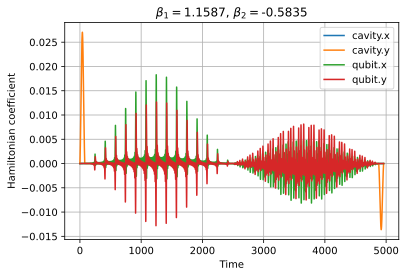

In [12]:
seq = snap_seq(b1, b2)
result = seq.run(system.ground_state())
fig, ax = seq.plot_coefficients(subplots=False)
ax.set_title(f'$\\beta_1 = ${b1:.4f}, $\\beta_2 = ${b2:.4f}')

State fidelity: 96.48 %


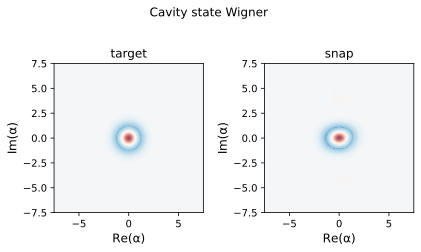

In [13]:
fidelity = qutip.fidelity(cavity.fock(1), result.states[-1])**2
assert fidelity > 0.96
print(f'State fidelity: {100*fidelity:.2f} %')

fig, (ax, bx) = plt.subplots(1,2)
qutip.plot_wigner(cavity.fock(1, full_space=False), ax=ax)
ax.set_title('target')
qutip.plot_wigner(result.states[-1].ptrace(cavity.index), ax=bx)
bx.set_title('snap')
for a in (ax, bx):
    a.set_aspect('equal')
fig.suptitle('Cavity state Wigner')
fig.tight_layout()
fig.subplots_adjust(top=1)

Text(0.5, 0.98, 'Cavity state photon number distriution')

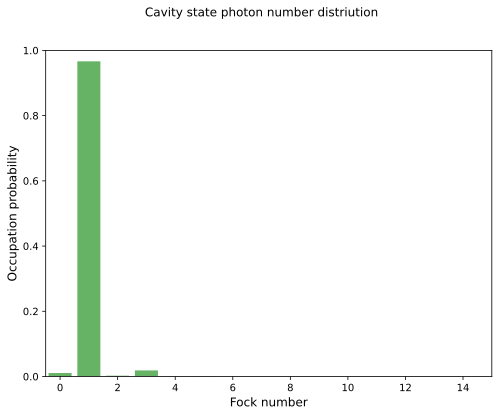

In [14]:
fig, ax = qutip.plot_fock_distribution(result.states[-1].ptrace(cavity.index))
fig.suptitle('Cavity state photon number distriution')

In [15]:
from qutip.ipynbtools import version_table
version_table()

Software,Version
QuTiP,4.5.2
Numpy,1.20.0
SciPy,1.6.0
matplotlib,3.3.4
Cython,0.29.21
Number of CPUs,2
BLAS Info,OPENBLAS
IPython,7.19.0
Python,"3.9.1 (default, Dec 11 2020, 06:28:49) [Clang 10.0.0 ]"
OS,posix [darwin]
